In [1]:
# Hyperparameters
N_EPOCH=200
BATCH_SIZE=64
LR=0.0002
B1=0.5
B2=0.999
N_CPU=8
LATENT_DIM=100
IMG_SIZE=32
CHANNELS=3
N_CRITIC=5
CLIP_VALUE=0.01
SAMPLE_INTERVAL=400
DATA_DIR = "/home/giusy/datasets"

In [2]:
import os
import numpy as np
import math
import sys
import torchvision.transforms as transforms
from torchvision.utils import save_image

from torch.utils.data import DataLoader, Subset
from torchvision import datasets
from torchvision.utils import make_grid
from torch.autograd import Variable
from torchvision import datasets
import torch.nn as nn
import torch.nn.functional as F
import torch.autograd as autograd
import torch
from tqdm import tqdm

from matplotlib import pyplot as plt
import sys

os.makedirs(DATA_DIR, exist_ok=True)
os.makedirs(os.path.join(DATA_DIR,"images_wgan_gp_modified_cifar"), exist_ok=True)

class Parser:
    n_epochs= N_EPOCH
    batch_size= BATCH_SIZE
    lr= LR
    b1= B1
    b2= B2
    n_cpu= N_CPU
    latent_dim= LATENT_DIM
    img_size= IMG_SIZE
    channels= CHANNELS
    n_critic= N_CRITIC
    clip_value= CLIP_VALUE
    sample_interval= SAMPLE_INTERVAL
    data_dir = DATA_DIR

opt = Parser()

%matplotlib inline

In [3]:
img_shape = (opt.channels, opt.img_size, opt.img_size)

In [4]:
cuda = True if torch.cuda.is_available() else False

In [5]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()

        self.init_size = opt.img_size // 4
        self.l1 = nn.Sequential(nn.Linear(opt.latent_dim, 128 * self.init_size ** 2))

        self.conv_blocks = nn.Sequential(
            nn.Upsample(scale_factor=2),
            nn.Conv2d(128, 128, 3, stride=1, padding=1),
            nn.BatchNorm2d(128, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(128, 64, 3, stride=1, padding=1),
            nn.BatchNorm2d(64, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, opt.channels, 3, stride=1, padding=1),
            nn.Tanh(),
        )

    def forward(self, z):
        out = self.l1(z)
        out = out.view(out.shape[0], 128, self.init_size, self.init_size)
        img = self.conv_blocks(out)
        return img


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        def discriminator_block(in_filters, out_filters, bn=True):
            block = [nn.Conv2d(in_filters, out_filters, 3, 2, 1), nn.LeakyReLU(0.2, inplace=True), nn.Dropout2d(0.25)]
            if bn:
                block.append(nn.BatchNorm2d(out_filters, 0.8))
            return block

        self.model = nn.Sequential(
            *discriminator_block(opt.channels, 16, bn=False),
            *discriminator_block(16, 32),
            *discriminator_block(32, 64),
            *discriminator_block(64, 128),
        )

        # The height and width of downsampled image
        ds_size = opt.img_size // 2 ** 4
        self.adv_layer = nn.Linear(128 * ds_size ** 2, 1)

    def forward(self, img):
        out = self.model(img)
        out = out.view(out.shape[0], -1)
        validity = self.adv_layer(out)

        return validity

In [6]:
# Loss weight for gradient penalty
lambda_gp = 10

# Initialize generator and discriminator
generator = Generator()
discriminator = Discriminator()

if cuda:
    generator.cuda()
    discriminator.cuda()

# Configure data loader
os.makedirs(opt.data_dir, exist_ok=True)

# Setup transform
transform=transforms.Compose(
            [transforms.Resize(opt.img_size), transforms.ToTensor(), transforms.Normalize([0.5], [0.5])]
        )

dataset = datasets.CIFAR10(root=opt.data_dir, train=True, download=False, transform=transform)

# Get cat indexes
cat_idx = [i for i in range(len(dataset)) if dataset.targets[i] == 3]
print(f"Selected samples: {len(cat_idx)}")

# Create subset
dataset = Subset(dataset, cat_idx)

# Create loader
dataloader = DataLoader(dataset, batch_size=opt.batch_size, shuffle=True, num_workers=opt.n_cpu, drop_last=True)

# Optimizers
optimizer_G = torch.optim.Adam(generator.parameters(), lr=opt.lr, betas=(opt.b1, opt.b2))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=opt.lr, betas=(opt.b1, opt.b2))

Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor

Selected samples: 5000


In [7]:
def compute_gradient_penalty(D, real_samples, fake_samples):
    """Calculates the gradient penalty loss for WGAN GP"""
    # Random weight term for interpolation between real and fake samples
    alpha = Tensor(np.random.random((real_samples.size(0), 1, 1, 1)))
    # Get random interpolation between real and fake samples
    interpolates = (alpha * real_samples + ((1 - alpha) * fake_samples)).requires_grad_(True)
    d_interpolates = D(interpolates)
    fake = Variable(Tensor(real_samples.shape[0], 1).fill_(1.0), requires_grad=False)
    # Get gradient w.r.t. interpolates
    gradients = autograd.grad(
        outputs=d_interpolates,
        inputs=interpolates,
        grad_outputs=fake,
        create_graph=True,
        retain_graph=True,
        only_inputs=True,
    )[0]
    gradients = gradients.view(gradients.size(0), -1)
    gradient_penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean()
    return gradient_penalty


  0%|          | 0/200 [00:00<?, ?it/s]

Epoch 1: DL=3.9762, GL=-0.0100


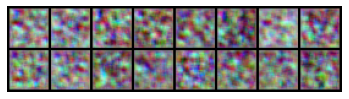

  0%|          | 1/200 [00:07<24:57,  7.53s/it]

Epoch 2: DL=1.5121, GL=-0.0498


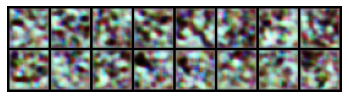

  1%|          | 2/200 [00:14<23:59,  7.27s/it]

Epoch 3: DL=1.7110, GL=-0.0667


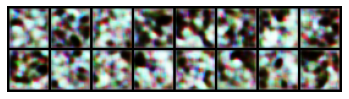

  2%|▏         | 3/200 [00:21<23:33,  7.17s/it]

Epoch 4: DL=2.0897, GL=-0.0628


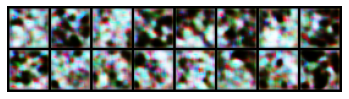

  2%|▏         | 4/200 [00:28<23:22,  7.16s/it]

Epoch 5: DL=1.5797, GL=-0.0819


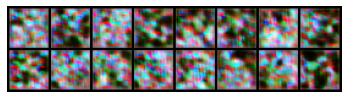

  2%|▎         | 5/200 [00:35<23:08,  7.12s/it]

Epoch 6: DL=1.0366, GL=-0.0501


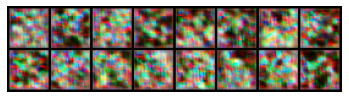

  3%|▎         | 6/200 [00:42<22:56,  7.10s/it]

Epoch 7: DL=1.1241, GL=-0.0287


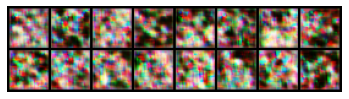

  4%|▎         | 7/200 [00:49<22:49,  7.09s/it]

Epoch 8: DL=1.3761, GL=-0.0697


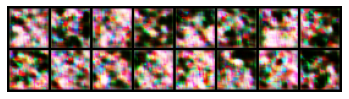

  4%|▍         | 8/200 [00:56<22:31,  7.04s/it]

Epoch 9: DL=1.1906, GL=-0.1188


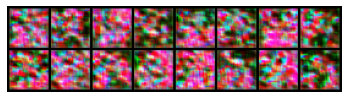

  4%|▍         | 9/200 [01:03<22:19,  7.01s/it]

Epoch 10: DL=1.0243, GL=-0.1098


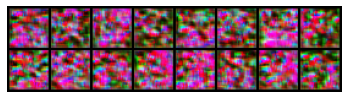

  5%|▌         | 10/200 [01:10<22:03,  6.97s/it]

Epoch 11: DL=1.0961, GL=-0.1392


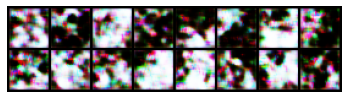

  6%|▌         | 11/200 [01:17<21:57,  6.97s/it]

Epoch 12: DL=-0.3113, GL=-0.0815


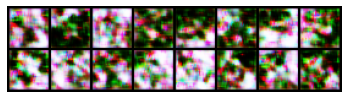

  6%|▌         | 12/200 [01:24<21:46,  6.95s/it]

Epoch 13: DL=-0.4916, GL=-0.2845


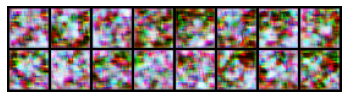

  6%|▋         | 13/200 [01:31<21:50,  7.01s/it]

Epoch 14: DL=-0.5522, GL=-0.4011


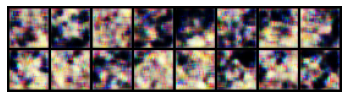

  7%|▋         | 14/200 [01:38<21:42,  7.00s/it]

Epoch 15: DL=-0.0244, GL=-0.4436


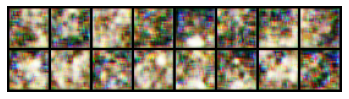

  8%|▊         | 15/200 [01:45<21:34,  7.00s/it]

Epoch 16: DL=0.0880, GL=-0.5443


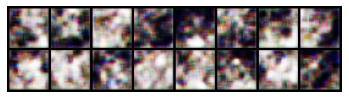

  8%|▊         | 16/200 [01:52<21:24,  6.98s/it]

Epoch 17: DL=0.1781, GL=-0.5648


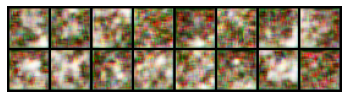

  8%|▊         | 17/200 [01:59<21:11,  6.95s/it]

Epoch 18: DL=0.1184, GL=-0.5898


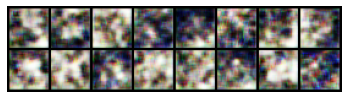

  9%|▉         | 18/200 [02:06<20:58,  6.91s/it]

Epoch 19: DL=0.0881, GL=-0.5975


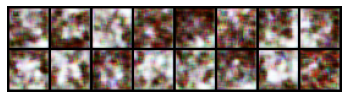

 10%|▉         | 19/200 [02:13<20:48,  6.90s/it]

Epoch 20: DL=0.1017, GL=-0.6094


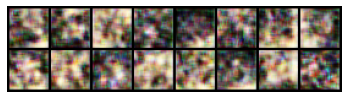

 10%|█         | 20/200 [02:20<20:51,  6.95s/it]

Epoch 21: DL=0.0516, GL=-0.5674


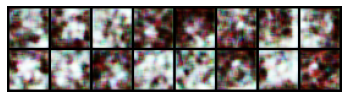

 10%|█         | 21/200 [02:27<21:00,  7.04s/it]

Epoch 22: DL=0.0995, GL=-0.5816


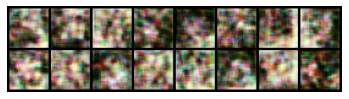

 11%|█         | 22/200 [02:34<20:52,  7.04s/it]

Epoch 23: DL=0.0842, GL=-0.4567


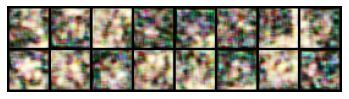

 12%|█▏        | 23/200 [02:41<20:44,  7.03s/it]

Epoch 24: DL=-0.0343, GL=-0.3634


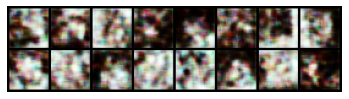

 12%|█▏        | 24/200 [02:48<20:42,  7.06s/it]

Epoch 25: DL=-0.0323, GL=-0.2190


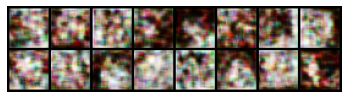

 12%|█▎        | 25/200 [02:55<20:28,  7.02s/it]

Epoch 26: DL=0.1175, GL=-0.1031


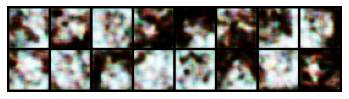

 13%|█▎        | 26/200 [03:02<20:21,  7.02s/it]

Epoch 27: DL=-0.0837, GL=-0.1243


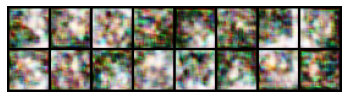

 14%|█▎        | 27/200 [03:09<20:20,  7.05s/it]

Epoch 28: DL=0.0323, GL=-0.2540


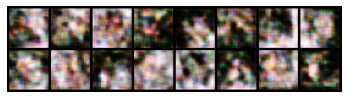

 14%|█▍        | 28/200 [03:16<20:12,  7.05s/it]

Epoch 29: DL=-0.0533, GL=-0.1555


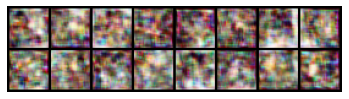

 14%|█▍        | 29/200 [03:23<20:06,  7.06s/it]

Epoch 30: DL=-0.0663, GL=-0.0968


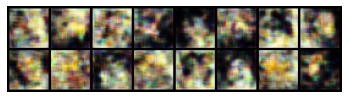

 15%|█▌        | 30/200 [03:30<19:56,  7.04s/it]

Epoch 31: DL=-0.2143, GL=-0.0640


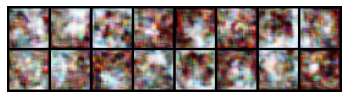

 16%|█▌        | 31/200 [03:37<19:45,  7.01s/it]

Epoch 32: DL=-0.1421, GL=0.0099


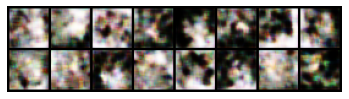

 16%|█▌        | 32/200 [03:44<19:36,  7.00s/it]

Epoch 33: DL=-0.0219, GL=-0.0337


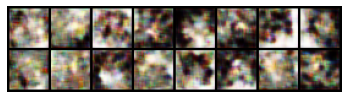

 16%|█▋        | 33/200 [03:51<19:27,  6.99s/it]

Epoch 34: DL=0.1554, GL=-0.1309


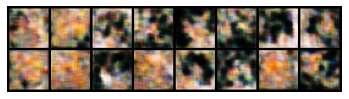

 17%|█▋        | 34/200 [03:58<19:22,  7.00s/it]

Epoch 35: DL=-0.0207, GL=-0.0390


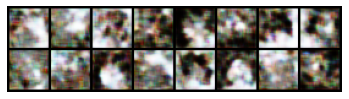

 18%|█▊        | 35/200 [04:05<19:15,  7.00s/it]

Epoch 36: DL=-0.0161, GL=-0.2449


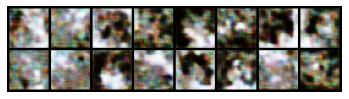

 18%|█▊        | 36/200 [04:12<19:12,  7.03s/it]

Epoch 37: DL=0.1806, GL=-0.3363


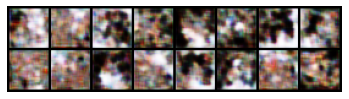

 18%|█▊        | 37/200 [04:19<19:04,  7.02s/it]

Epoch 38: DL=0.0843, GL=-0.3376


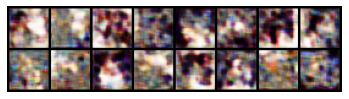

 19%|█▉        | 38/200 [04:27<18:58,  7.03s/it]

Epoch 39: DL=0.0372, GL=-0.4000


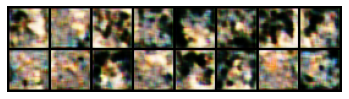

 20%|█▉        | 39/200 [04:33<18:45,  6.99s/it]

Epoch 40: DL=0.0269, GL=-0.3894


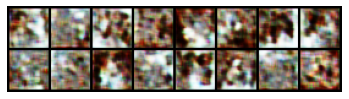

 20%|██        | 40/200 [04:40<18:38,  6.99s/it]

Epoch 41: DL=0.0163, GL=-0.5114


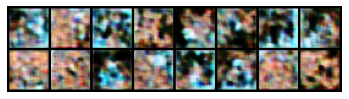

 20%|██        | 41/200 [04:47<18:29,  6.98s/it]

Epoch 42: DL=0.1299, GL=-0.5633


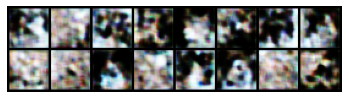

 21%|██        | 42/200 [04:54<18:21,  6.97s/it]

Epoch 43: DL=-0.1278, GL=-0.3754


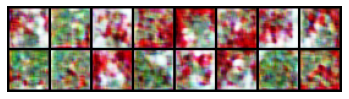

 22%|██▏       | 43/200 [05:01<18:13,  6.96s/it]

Epoch 44: DL=0.0812, GL=-0.6541


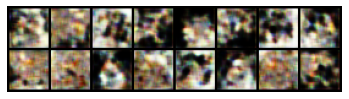

 22%|██▏       | 44/200 [05:08<18:04,  6.95s/it]

Epoch 45: DL=-0.1075, GL=-0.5769


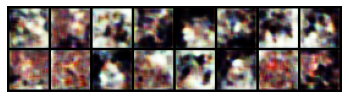

 22%|██▎       | 45/200 [05:15<17:55,  6.94s/it]

Epoch 46: DL=0.0462, GL=-0.5096


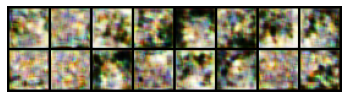

 23%|██▎       | 46/200 [05:22<17:53,  6.97s/it]

Epoch 47: DL=0.1730, GL=-0.5534


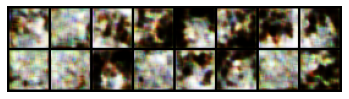

 24%|██▎       | 47/200 [05:29<17:43,  6.95s/it]

Epoch 48: DL=-0.0949, GL=-0.4724


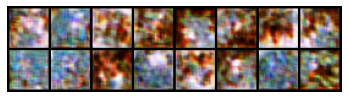

 24%|██▍       | 48/200 [05:36<17:44,  7.01s/it]

Epoch 49: DL=0.1075, GL=-0.6278


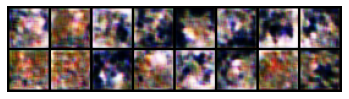

 24%|██▍       | 49/200 [05:43<17:33,  6.98s/it]

Epoch 50: DL=0.0682, GL=-0.5181


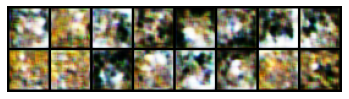

 25%|██▌       | 50/200 [05:50<17:26,  6.97s/it]

Epoch 51: DL=0.0631, GL=-0.4887


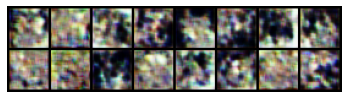

 26%|██▌       | 51/200 [05:57<17:16,  6.95s/it]

Epoch 52: DL=0.1078, GL=-0.5442


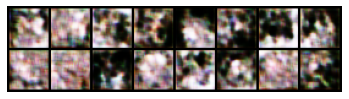

 26%|██▌       | 52/200 [06:04<17:08,  6.95s/it]

Epoch 53: DL=0.0836, GL=-0.5333


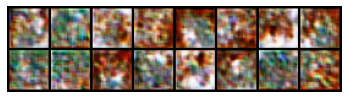

 26%|██▋       | 53/200 [06:11<17:09,  7.00s/it]

Epoch 54: DL=0.0589, GL=-0.4360


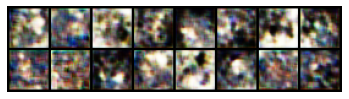

 27%|██▋       | 54/200 [06:18<17:01,  6.99s/it]

Epoch 55: DL=0.0663, GL=-0.4467


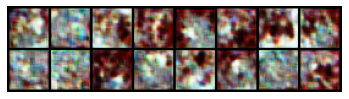

 28%|██▊       | 55/200 [06:25<16:52,  6.98s/it]

Epoch 56: DL=0.0921, GL=-0.4443


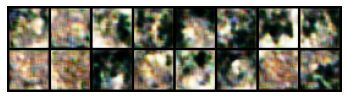

 28%|██▊       | 56/200 [06:32<16:48,  7.00s/it]

Epoch 57: DL=0.0916, GL=-0.4572


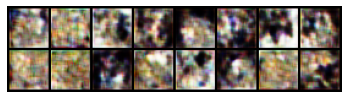

 28%|██▊       | 57/200 [06:39<16:44,  7.02s/it]

Epoch 58: DL=-0.0458, GL=-0.4742


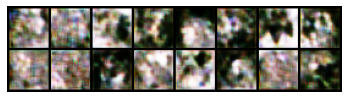

 29%|██▉       | 58/200 [06:46<16:37,  7.02s/it]

Epoch 59: DL=0.0684, GL=-0.5690


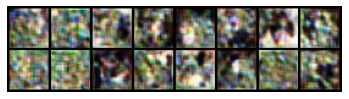

 30%|██▉       | 59/200 [06:53<16:27,  7.01s/it]

Epoch 60: DL=-0.0519, GL=-0.5820


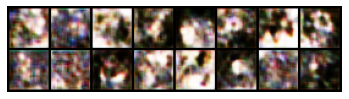

 30%|███       | 60/200 [07:00<16:24,  7.03s/it]

Epoch 61: DL=0.0476, GL=-0.5055


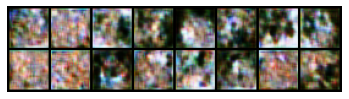

 30%|███       | 61/200 [07:07<16:16,  7.03s/it]

Epoch 62: DL=0.0637, GL=-0.6128


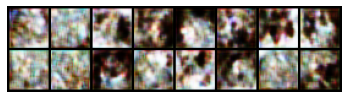

 31%|███       | 62/200 [07:14<16:05,  7.00s/it]

Epoch 63: DL=0.0044, GL=-0.6651


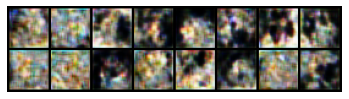

 32%|███▏      | 63/200 [07:21<15:59,  7.00s/it]

Epoch 64: DL=0.1045, GL=-0.5936


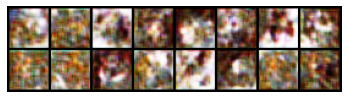

 32%|███▏      | 64/200 [07:28<15:51,  7.00s/it]

Epoch 65: DL=-0.0345, GL=-0.6249


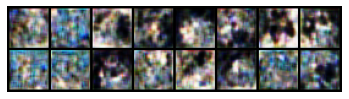

 32%|███▎      | 65/200 [07:35<15:47,  7.02s/it]

Epoch 66: DL=-0.0297, GL=-0.5155


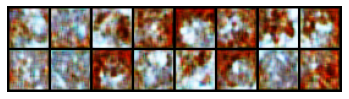

 33%|███▎      | 66/200 [07:42<15:48,  7.08s/it]

Epoch 67: DL=0.1128, GL=-0.6663


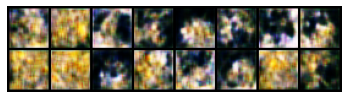

 34%|███▎      | 67/200 [07:49<15:38,  7.06s/it]

Epoch 68: DL=0.0696, GL=-0.5244


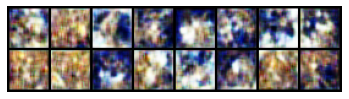

 34%|███▍      | 68/200 [07:56<15:32,  7.07s/it]

Epoch 69: DL=-0.0674, GL=-0.5723


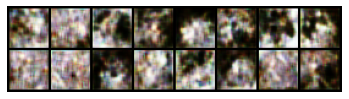

 34%|███▍      | 69/200 [08:03<15:21,  7.03s/it]

Epoch 70: DL=0.0439, GL=-0.3771


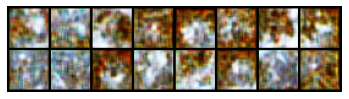

 35%|███▌      | 70/200 [08:11<15:17,  7.06s/it]

Epoch 71: DL=0.0311, GL=-0.4124


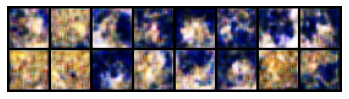

 36%|███▌      | 71/200 [08:18<15:12,  7.08s/it]

Epoch 72: DL=0.0362, GL=-0.4158


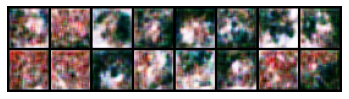

 36%|███▌      | 72/200 [08:25<15:09,  7.11s/it]

Epoch 73: DL=0.0293, GL=-0.3686


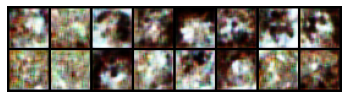

 36%|███▋      | 73/200 [08:32<14:56,  7.06s/it]

Epoch 74: DL=0.0779, GL=-0.3486


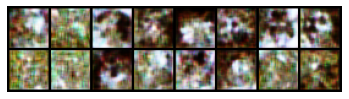

 37%|███▋      | 74/200 [08:39<14:49,  7.06s/it]

Epoch 75: DL=-0.0776, GL=-0.3537


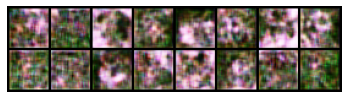

 38%|███▊      | 75/200 [08:46<14:37,  7.02s/it]

Epoch 76: DL=-0.0749, GL=-0.3169


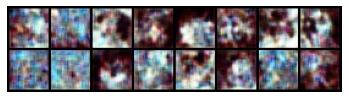

 38%|███▊      | 76/200 [08:53<14:30,  7.02s/it]

Epoch 77: DL=0.1524, GL=-0.3116


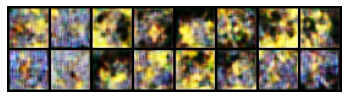

 38%|███▊      | 77/200 [09:00<14:22,  7.01s/it]

Epoch 78: DL=-0.1228, GL=-0.3853


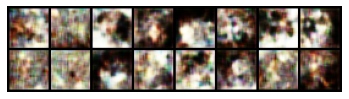

 39%|███▉      | 78/200 [09:07<14:14,  7.00s/it]

Epoch 79: DL=0.0095, GL=-0.5042


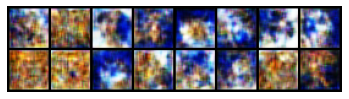

 40%|███▉      | 79/200 [09:14<14:07,  7.01s/it]

Epoch 80: DL=0.0978, GL=-0.5109


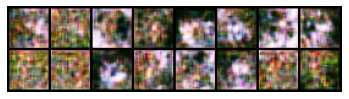

 40%|████      | 80/200 [09:21<13:55,  6.97s/it]

Epoch 81: DL=0.0927, GL=-0.5093


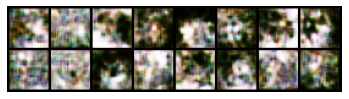

 40%|████      | 81/200 [09:28<13:48,  6.96s/it]

Epoch 82: DL=-0.0003, GL=-0.4534


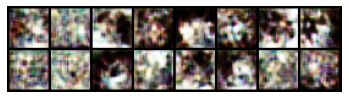

 41%|████      | 82/200 [09:34<13:36,  6.92s/it]

Epoch 83: DL=-0.0146, GL=-0.5451


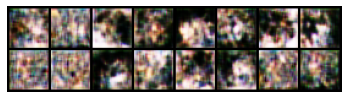

 42%|████▏     | 83/200 [09:42<13:34,  6.96s/it]

Epoch 84: DL=0.0661, GL=-0.4081


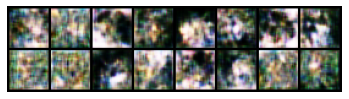

 42%|████▏     | 84/200 [09:48<13:26,  6.95s/it]

Epoch 85: DL=0.1526, GL=-0.4132


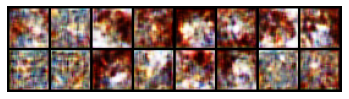

 42%|████▎     | 85/200 [09:55<13:18,  6.94s/it]

Epoch 86: DL=0.1088, GL=-0.3743


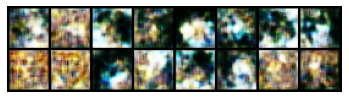

 43%|████▎     | 86/200 [10:02<13:09,  6.93s/it]

Epoch 87: DL=-0.0780, GL=-0.3846


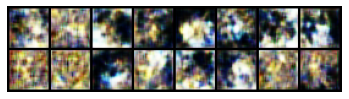

 44%|████▎     | 87/200 [10:09<13:05,  6.95s/it]

Epoch 88: DL=0.1835, GL=-0.4840


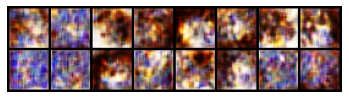

 44%|████▍     | 88/200 [10:16<13:02,  6.99s/it]

Epoch 89: DL=0.0069, GL=-0.3942


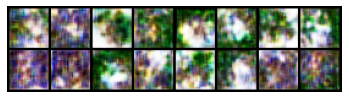

 44%|████▍     | 89/200 [10:23<12:54,  6.98s/it]

Epoch 90: DL=-0.0266, GL=-0.4255


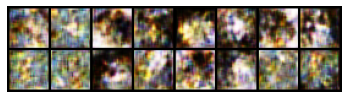

 45%|████▌     | 90/200 [10:30<12:43,  6.95s/it]

Epoch 91: DL=0.0415, GL=-0.4016


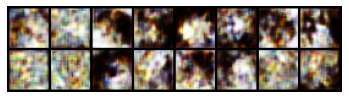

 46%|████▌     | 91/200 [10:37<12:39,  6.97s/it]

Epoch 92: DL=0.1646, GL=-0.4649


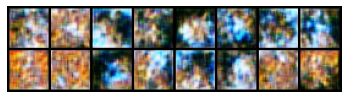

 46%|████▌     | 92/200 [10:44<12:31,  6.96s/it]

Epoch 93: DL=-0.0604, GL=-0.6317


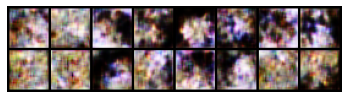

 46%|████▋     | 93/200 [10:51<12:24,  6.95s/it]

Epoch 94: DL=0.0073, GL=-0.6259


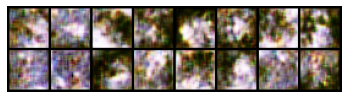

 47%|████▋     | 94/200 [10:58<12:18,  6.96s/it]

Epoch 95: DL=0.0837, GL=-0.6600


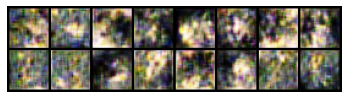

 48%|████▊     | 95/200 [11:05<12:11,  6.97s/it]

Epoch 96: DL=0.0886, GL=-0.5694


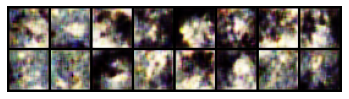

 48%|████▊     | 96/200 [11:12<12:10,  7.02s/it]

Epoch 97: DL=0.0205, GL=-0.4924


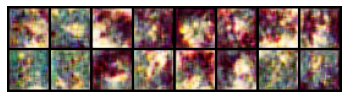

 48%|████▊     | 97/200 [11:19<12:01,  7.00s/it]

Epoch 98: DL=-0.0816, GL=-0.4884


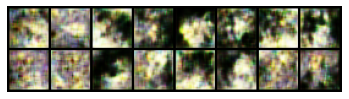

 49%|████▉     | 98/200 [11:26<11:50,  6.96s/it]

Epoch 99: DL=-0.0369, GL=-0.4576


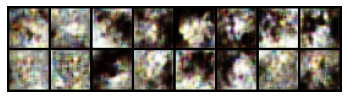

 50%|████▉     | 99/200 [11:33<11:40,  6.93s/it]

Epoch 100: DL=0.0466, GL=-0.5531


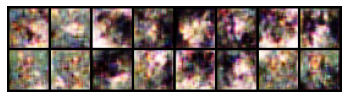

 50%|█████     | 100/200 [11:40<11:34,  6.94s/it]

Epoch 101: DL=-0.1794, GL=-0.5133


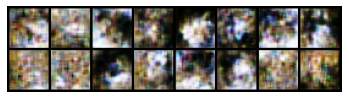

 50%|█████     | 101/200 [11:47<11:31,  6.99s/it]

Epoch 102: DL=-0.0483, GL=-0.4272


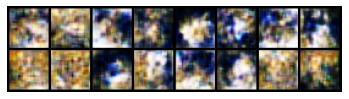

 51%|█████     | 102/200 [11:54<11:25,  7.00s/it]

Epoch 103: DL=0.0028, GL=-0.4288


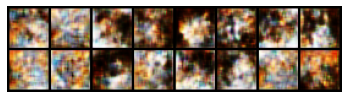

 52%|█████▏    | 103/200 [12:01<11:17,  6.99s/it]

Epoch 104: DL=-0.2097, GL=-0.2444


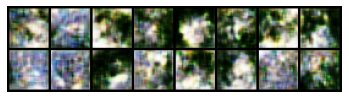

 52%|█████▏    | 104/200 [12:08<11:08,  6.97s/it]

Epoch 105: DL=0.0274, GL=-0.4351


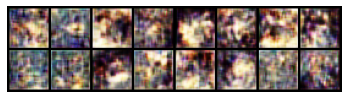

 52%|█████▎    | 105/200 [12:15<10:58,  6.93s/it]

Epoch 106: DL=0.0426, GL=-0.5227


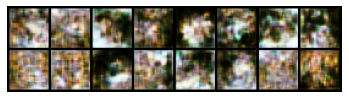

 53%|█████▎    | 106/200 [12:22<10:52,  6.95s/it]

Epoch 107: DL=-0.0548, GL=-0.3221


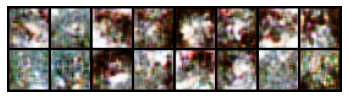

 54%|█████▎    | 107/200 [12:29<10:47,  6.96s/it]

Epoch 108: DL=-0.0079, GL=-0.4766


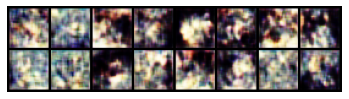

 54%|█████▍    | 108/200 [12:36<10:39,  6.95s/it]

Epoch 109: DL=0.0041, GL=-0.5339


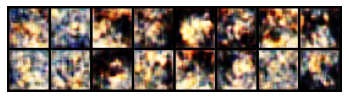

 55%|█████▍    | 109/200 [12:43<10:32,  6.95s/it]

Epoch 110: DL=-0.0274, GL=-0.3999


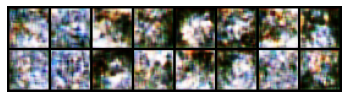

 55%|█████▌    | 110/200 [12:49<10:25,  6.95s/it]

Epoch 111: DL=-0.0719, GL=-0.2456


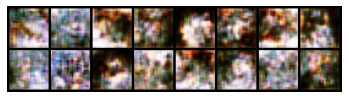

 56%|█████▌    | 111/200 [12:56<10:20,  6.97s/it]

Epoch 112: DL=0.0108, GL=-0.1877


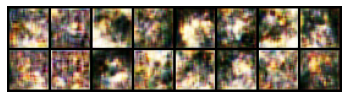

 56%|█████▌    | 112/200 [13:03<10:12,  6.96s/it]

Epoch 113: DL=0.1069, GL=-0.1714


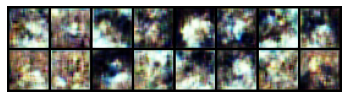

 56%|█████▋    | 113/200 [13:10<10:05,  6.96s/it]

Epoch 114: DL=0.0010, GL=-0.2957


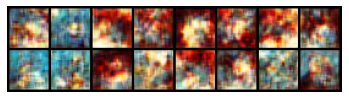

 57%|█████▋    | 114/200 [13:17<09:58,  6.95s/it]

Epoch 115: DL=-0.1067, GL=-0.3392


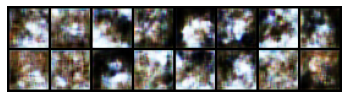

 57%|█████▊    | 115/200 [13:24<09:52,  6.97s/it]

Epoch 116: DL=-0.0881, GL=-0.2873


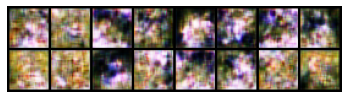

 58%|█████▊    | 116/200 [13:31<09:42,  6.94s/it]

Epoch 117: DL=-0.0018, GL=-0.3421


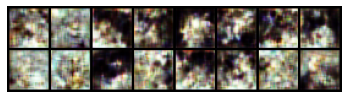

 58%|█████▊    | 117/200 [13:38<09:33,  6.91s/it]

Epoch 118: DL=-0.0708, GL=-0.2582


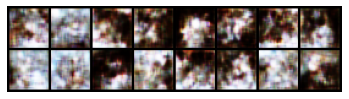

 59%|█████▉    | 118/200 [13:45<09:28,  6.93s/it]

Epoch 119: DL=-0.0431, GL=-0.2733


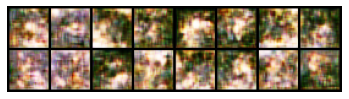

 60%|█████▉    | 119/200 [13:52<09:20,  6.92s/it]

Epoch 120: DL=0.0643, GL=-0.2541


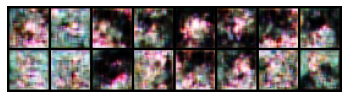

 60%|██████    | 120/200 [13:59<09:15,  6.94s/it]

Epoch 121: DL=0.0604, GL=-0.1685


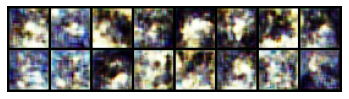

 60%|██████    | 121/200 [14:06<09:08,  6.95s/it]

Epoch 122: DL=-0.1615, GL=-0.3062


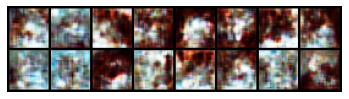

 61%|██████    | 122/200 [14:13<09:02,  6.95s/it]

Epoch 123: DL=0.1281, GL=-0.3310


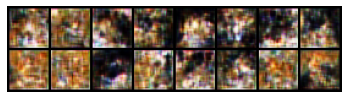

 62%|██████▏   | 123/200 [14:20<08:54,  6.95s/it]

Epoch 124: DL=-0.1163, GL=0.0190


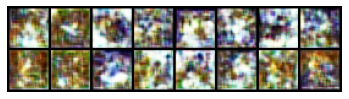

 62%|██████▏   | 124/200 [14:27<08:48,  6.96s/it]

Epoch 125: DL=-0.7210, GL=-0.0729


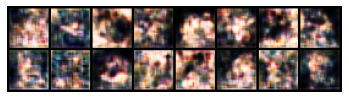

 62%|██████▎   | 125/200 [14:34<08:41,  6.96s/it]

Epoch 126: DL=-0.2386, GL=-0.1059


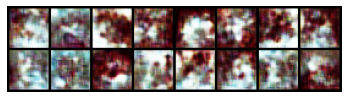

 63%|██████▎   | 126/200 [14:41<08:34,  6.96s/it]

Epoch 127: DL=0.3121, GL=-0.2947


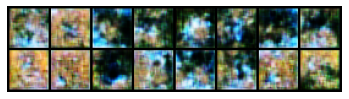

 64%|██████▎   | 127/200 [14:48<08:25,  6.93s/it]

Epoch 128: DL=-0.2339, GL=-0.2344


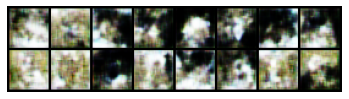

 64%|██████▍   | 128/200 [14:54<08:20,  6.95s/it]

Epoch 129: DL=0.1231, GL=-0.5413


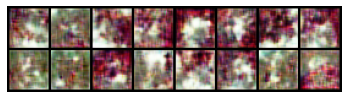

 64%|██████▍   | 129/200 [15:01<08:13,  6.95s/it]

Epoch 130: DL=-0.0752, GL=-0.5354


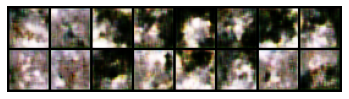

 65%|██████▌   | 130/200 [15:08<08:06,  6.95s/it]

Epoch 131: DL=-0.0641, GL=-0.4272


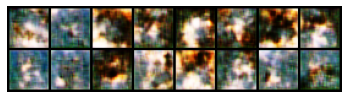

 66%|██████▌   | 131/200 [15:15<08:01,  6.98s/it]

Epoch 132: DL=-0.0356, GL=-0.5425


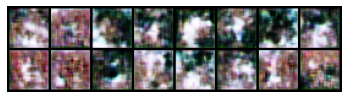

 66%|██████▌   | 132/200 [15:22<07:52,  6.95s/it]

Epoch 133: DL=0.0923, GL=-0.5903


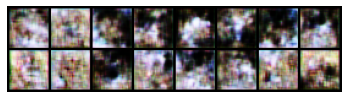

 66%|██████▋   | 133/200 [15:29<07:44,  6.93s/it]

Epoch 134: DL=-0.0920, GL=-0.5211


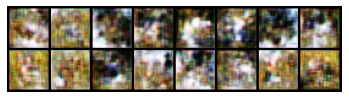

 67%|██████▋   | 134/200 [15:36<07:37,  6.93s/it]

Epoch 135: DL=-0.1484, GL=-0.5202


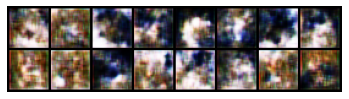

 68%|██████▊   | 135/200 [15:43<07:30,  6.94s/it]

Epoch 136: DL=-0.2259, GL=-0.3337


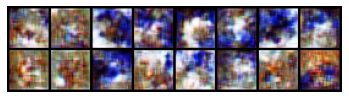

 68%|██████▊   | 136/200 [15:50<07:22,  6.92s/it]

Epoch 137: DL=0.0723, GL=-0.2890


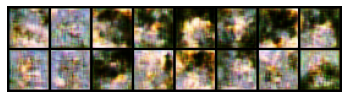

 68%|██████▊   | 137/200 [15:57<07:16,  6.93s/it]

Epoch 138: DL=0.0684, GL=-0.3518


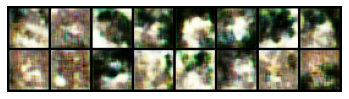

 69%|██████▉   | 138/200 [16:04<07:11,  6.96s/it]

Epoch 139: DL=0.1150, GL=-0.4547


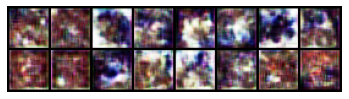

 70%|██████▉   | 139/200 [16:11<07:04,  6.96s/it]

Epoch 140: DL=-0.3788, GL=-0.3080


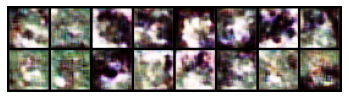

 70%|███████   | 140/200 [16:18<06:59,  6.99s/it]

Epoch 141: DL=0.1885, GL=-0.4885


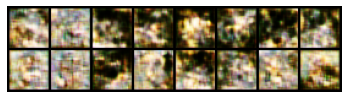

 70%|███████   | 141/200 [16:25<06:51,  6.98s/it]

Epoch 142: DL=-0.2845, GL=-0.3927


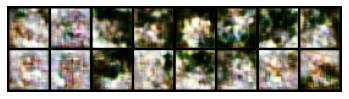

 71%|███████   | 142/200 [16:32<06:47,  7.03s/it]

Epoch 143: DL=0.0793, GL=-0.7272


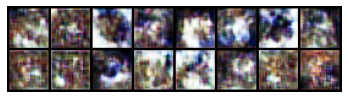

 72%|███████▏  | 143/200 [16:39<06:43,  7.08s/it]

Epoch 144: DL=0.2072, GL=-0.7631


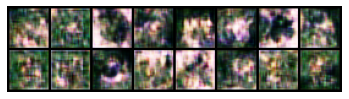

 72%|███████▏  | 144/200 [16:46<06:37,  7.09s/it]

Epoch 145: DL=-0.1139, GL=-0.5472


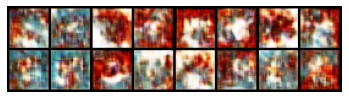

 72%|███████▎  | 145/200 [16:53<06:28,  7.05s/it]

Epoch 146: DL=-0.5198, GL=-0.4937


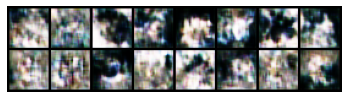

 73%|███████▎  | 146/200 [17:00<06:21,  7.07s/it]

Epoch 147: DL=0.5442, GL=-0.8403


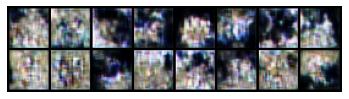

 74%|███████▎  | 147/200 [17:08<06:17,  7.13s/it]

Epoch 148: DL=-0.1039, GL=-0.8600


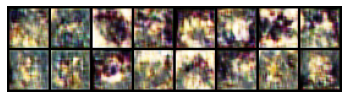

 74%|███████▍  | 148/200 [17:15<06:09,  7.11s/it]

Epoch 149: DL=-0.1947, GL=-0.6731


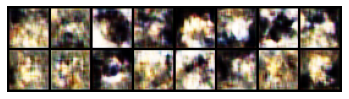

 74%|███████▍  | 149/200 [17:22<06:00,  7.07s/it]

Epoch 150: DL=0.1456, GL=-0.7130


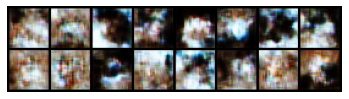

 75%|███████▌  | 150/200 [17:29<05:51,  7.04s/it]

Epoch 151: DL=0.0916, GL=-0.6052


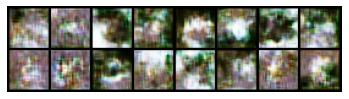

 76%|███████▌  | 151/200 [17:36<05:46,  7.07s/it]

Epoch 152: DL=0.1393, GL=-0.6965


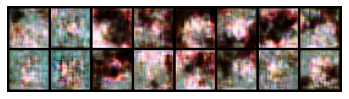

 76%|███████▌  | 152/200 [17:43<05:39,  7.07s/it]

Epoch 153: DL=-0.0930, GL=-0.6236


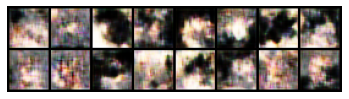

 76%|███████▋  | 153/200 [17:50<05:31,  7.05s/it]

Epoch 154: DL=0.0657, GL=-0.7125


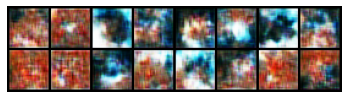

 77%|███████▋  | 154/200 [17:57<05:22,  7.02s/it]

Epoch 155: DL=-0.0324, GL=-0.7160


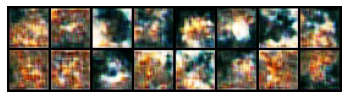

 78%|███████▊  | 155/200 [18:04<05:13,  6.96s/it]

Epoch 156: DL=-0.1051, GL=-0.7346


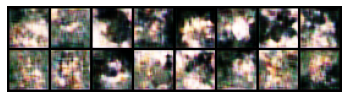

 78%|███████▊  | 156/200 [18:11<05:05,  6.95s/it]

Epoch 157: DL=0.1056, GL=-0.7450


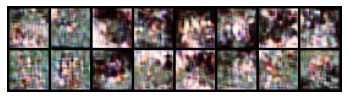

 78%|███████▊  | 157/200 [18:18<04:58,  6.94s/it]

Epoch 158: DL=0.0497, GL=-0.7036


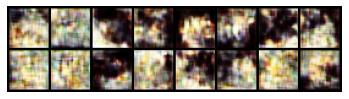

 79%|███████▉  | 158/200 [18:25<04:52,  6.96s/it]

Epoch 159: DL=-0.1734, GL=-0.5781


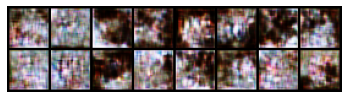

 80%|███████▉  | 159/200 [18:32<04:46,  6.98s/it]

Epoch 160: DL=-0.0086, GL=-0.6291


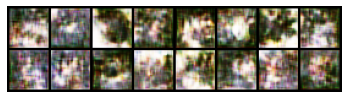

 80%|████████  | 160/200 [18:39<04:39,  7.00s/it]

Epoch 161: DL=-0.0003, GL=-0.5877


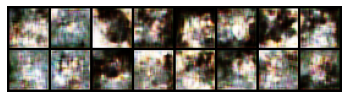

 80%|████████  | 161/200 [18:46<04:31,  6.97s/it]

Epoch 162: DL=0.0747, GL=-0.6701


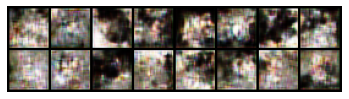

 81%|████████  | 162/200 [18:53<04:24,  6.97s/it]

Epoch 163: DL=0.0377, GL=-0.6780


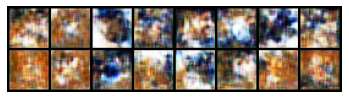

 82%|████████▏ | 163/200 [18:59<04:17,  6.95s/it]

Epoch 164: DL=-0.1929, GL=-0.5246


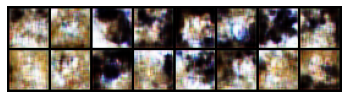

 82%|████████▏ | 164/200 [19:06<04:10,  6.95s/it]

Epoch 165: DL=0.0852, GL=-0.6879


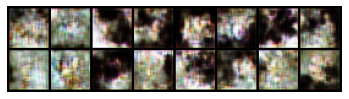

 82%|████████▎ | 165/200 [19:13<04:03,  6.95s/it]

Epoch 166: DL=0.1591, GL=-0.9252


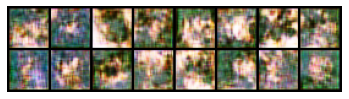

 83%|████████▎ | 166/200 [19:20<03:57,  7.00s/it]

Epoch 167: DL=-0.2106, GL=-0.7571


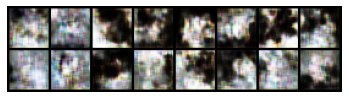

 84%|████████▎ | 167/200 [19:27<03:51,  7.00s/it]

Epoch 168: DL=0.1501, GL=-0.7620


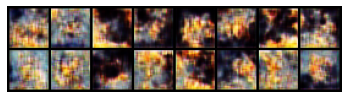

 84%|████████▍ | 168/200 [19:34<03:44,  7.00s/it]

Epoch 169: DL=0.0128, GL=-0.7656


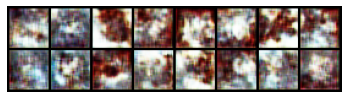

 84%|████████▍ | 169/200 [19:41<03:36,  6.97s/it]

Epoch 170: DL=-0.2845, GL=-0.7831


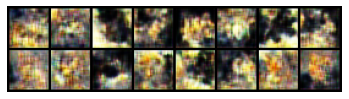

 85%|████████▌ | 170/200 [19:48<03:28,  6.96s/it]

Epoch 171: DL=0.0260, GL=-0.6535


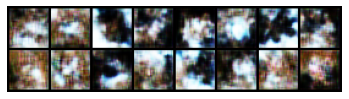

 86%|████████▌ | 171/200 [19:55<03:22,  6.98s/it]

Epoch 172: DL=-0.1347, GL=-0.7446


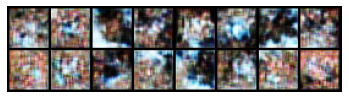

 86%|████████▌ | 172/200 [20:02<03:15,  6.98s/it]

Epoch 173: DL=-0.0225, GL=-1.0714


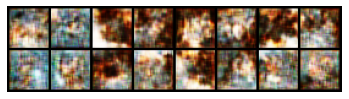

 86%|████████▋ | 173/200 [20:09<03:09,  7.00s/it]

Epoch 174: DL=0.1016, GL=-1.1510


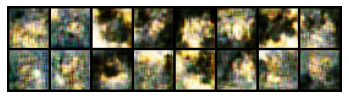

 87%|████████▋ | 174/200 [20:16<03:02,  7.03s/it]

Epoch 175: DL=0.0651, GL=-1.1181


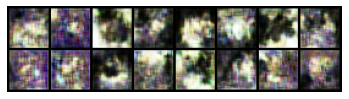

 88%|████████▊ | 175/200 [20:23<02:54,  7.00s/it]

Epoch 176: DL=0.0077, GL=-1.0357


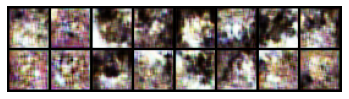

 88%|████████▊ | 176/200 [20:30<02:47,  7.00s/it]

Epoch 177: DL=0.0151, GL=-1.1044


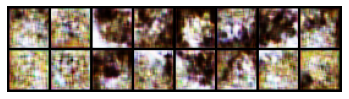

 88%|████████▊ | 177/200 [20:37<02:40,  6.98s/it]

Epoch 178: DL=0.0144, GL=-1.0092


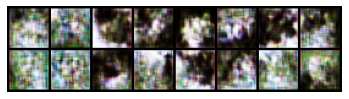

 89%|████████▉ | 178/200 [20:44<02:32,  6.95s/it]

Epoch 179: DL=0.0477, GL=-0.9703


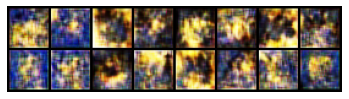

 90%|████████▉ | 179/200 [20:51<02:25,  6.94s/it]

Epoch 180: DL=0.1283, GL=-0.9306


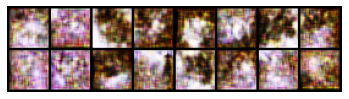

 90%|█████████ | 180/200 [20:58<02:19,  6.96s/it]

Epoch 181: DL=0.0664, GL=-0.8787


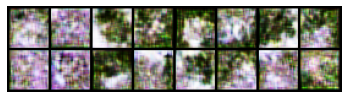

 90%|█████████ | 181/200 [21:05<02:12,  6.96s/it]

Epoch 182: DL=-0.0718, GL=-0.8677


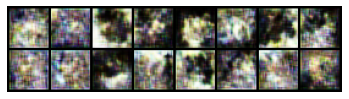

 91%|█████████ | 182/200 [21:12<02:04,  6.93s/it]

Epoch 183: DL=0.2978, GL=-0.9504


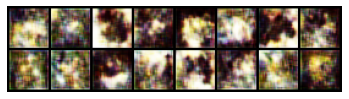

 92%|█████████▏| 183/200 [21:19<01:57,  6.92s/it]

Epoch 184: DL=-0.1480, GL=-0.7884


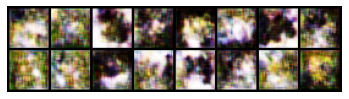

 92%|█████████▏| 184/200 [21:26<01:50,  6.92s/it]

Epoch 185: DL=-0.0255, GL=-0.7029


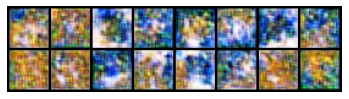

 92%|█████████▎| 185/200 [21:33<01:44,  6.94s/it]

Epoch 186: DL=0.0322, GL=-0.8102


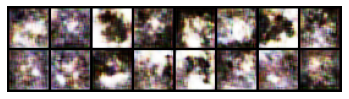

 93%|█████████▎| 186/200 [21:40<01:37,  6.94s/it]

Epoch 187: DL=-0.0331, GL=-0.8218


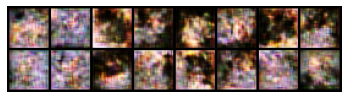

 94%|█████████▎| 187/200 [21:47<01:30,  6.95s/it]

Epoch 188: DL=0.0798, GL=-0.6432


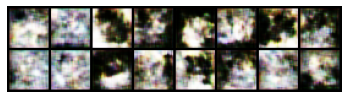

 94%|█████████▍| 188/200 [21:54<01:23,  6.95s/it]

Epoch 189: DL=0.0497, GL=-0.8078


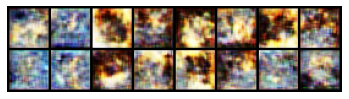

 94%|█████████▍| 189/200 [22:01<01:16,  6.99s/it]

Epoch 190: DL=-0.1051, GL=-0.9469


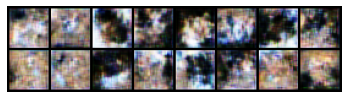

 95%|█████████▌| 190/200 [22:08<01:09,  6.98s/it]

Epoch 191: DL=-0.0303, GL=-0.9305


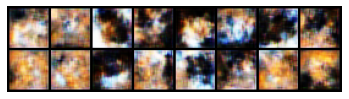

 96%|█████████▌| 191/200 [22:15<01:02,  6.97s/it]

Epoch 192: DL=0.0081, GL=-0.8651


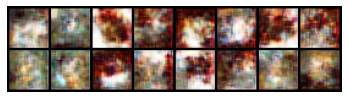

 96%|█████████▌| 192/200 [22:22<00:55,  6.99s/it]

Epoch 193: DL=0.1063, GL=-0.8072


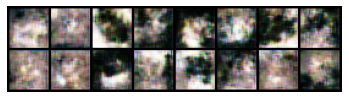

 96%|█████████▋| 193/200 [22:29<00:48,  6.98s/it]

Epoch 194: DL=0.0065, GL=-0.7167


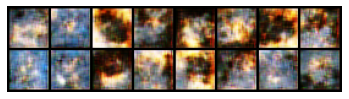

 97%|█████████▋| 194/200 [22:35<00:41,  6.96s/it]

Epoch 195: DL=0.0625, GL=-0.7734


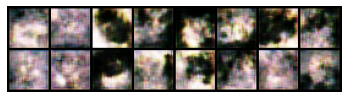

 98%|█████████▊| 195/200 [22:42<00:34,  6.95s/it]

Epoch 196: DL=-0.0854, GL=-0.8248


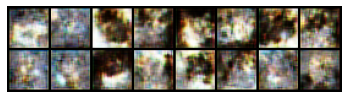

 98%|█████████▊| 196/200 [22:49<00:27,  6.96s/it]

Epoch 197: DL=-0.0883, GL=-0.8120


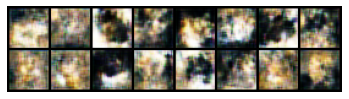

 98%|█████████▊| 197/200 [22:56<00:20,  6.94s/it]

Epoch 198: DL=0.0880, GL=-0.8329


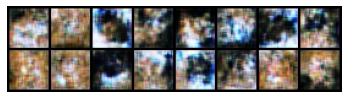

 99%|█████████▉| 198/200 [23:03<00:13,  6.93s/it]

Epoch 199: DL=0.1018, GL=-0.7982


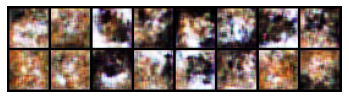

100%|█████████▉| 199/200 [23:10<00:06,  6.93s/it]

Epoch 200: DL=-0.2930, GL=-0.6405


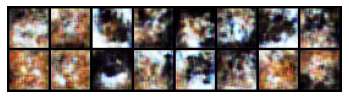

100%|██████████| 200/200 [23:17<00:00,  6.99s/it]


In [8]:
# ----------
#  Training
# ----------
fixed_noise = Tensor(np.random.normal(0, 1, (32, opt.latent_dim)))
batches_done = 0

# Loss history
hist_d_loss = []
hist_g_loss = []

for epoch in tqdm(range(opt.n_epochs)):
    # Losses 
    sum_d_loss = 0
    sum_g_loss = 0
    
    discriminator.train()
    generator.train()
    
    for i, (imgs, _) in enumerate(dataloader):
        
        # Configure input
        real_imgs = Variable(imgs.type(Tensor))

        # ---------------------
        #  Train Discriminator
        # ---------------------

        optimizer_D.zero_grad()

        # Sample noise as generator input
        z = Variable(Tensor(np.random.normal(0, 1, (imgs.shape[0], opt.latent_dim))))

        # Generate a batch of images
        fake_imgs = generator(z)

        # Real images
        real_validity = discriminator(real_imgs)
        # Fake images
        fake_validity = discriminator(fake_imgs)
        # Gradient penalty
        gradient_penalty = compute_gradient_penalty(discriminator, real_imgs.data, fake_imgs.data)
        # Adversarial loss
        d_loss = -torch.mean(real_validity) + torch.mean(fake_validity) + lambda_gp * gradient_penalty

        sum_d_loss += float(d_loss)
        
        d_loss.backward()
        optimizer_D.step()

        optimizer_G.zero_grad()

        # Train the generator every n_critic steps
        if i % opt.n_critic == 0:

            # -----------------
            #  Train Generator
            # -----------------

            # Generate a batch of images
            fake_imgs = generator(z)
            # Loss measures generator's ability to fool the discriminator
            # Train on fake images
            fake_validity = discriminator(fake_imgs)
            g_loss = -torch.mean(fake_validity)
            
            sum_g_loss += float(g_loss)

            g_loss.backward()
            optimizer_G.step()            
            
            if batches_done % opt.sample_interval == 0:
                save_image(fake_imgs.data[:25], os.path.join(opt.data_dir, "images_wgan_gp_modified_cifar/%d.png" % batches_done), nrow=5, normalize=True)

            batches_done += opt.n_critic
      
    epoch_d_loss = sum_d_loss/len(dataloader)
    epoch_g_loss = sum_g_loss/len(dataloader)
    hist_d_loss.append(epoch_d_loss)
    hist_g_loss.append(epoch_g_loss)
    print(f"Epoch {epoch+1}: DL={epoch_d_loss:.4f}, GL={epoch_g_loss:.4f}")
    
    generator.eval()
        
    with torch.no_grad():
        g_output = generator(fixed_noise)[:16,:,:]
        plt.imshow(transforms.ToPILImage()(make_grid(g_output, scale_each=True, normalize=True).cpu()))
        plt.axis('off')
        plt.show()

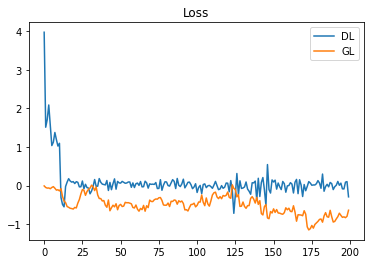

In [9]:
# Plot loss
plt.title("Loss")
plt.plot(hist_d_loss, label="DL")
plt.plot(hist_g_loss, label="GL")
plt.legend()
plt.show()